In [1]:
# Подход: кластеризуем изображения, а stl-ки в центры кластеров пытаемся

In [41]:
import os
import numpy as np
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import euclidean_distances
import pickle

In [4]:
# Конфигурационные параметры
EMBEDDING_SIZE = 256  # Размер выходного эмбеддинга
IMAGE_SIZE = 224      # Размер изображения для ResNet
BATCH_SIZE = 32       # Размер батча для обработки

# Путь к папке с данными
DATA_PATH = 'images_train'

# Проверка доступности GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [5]:
class EmbeddingExtractor(nn.Module):
    def __init__(self, embedding_size):
        super(EmbeddingExtractor, self).__init__()
        # Загрузка предобученной ResNet50
        self.resnet = models.resnet50(pretrained=True)
        # Удаляем последний полносвязный слой
        self.resnet = nn.Sequential(*list(self.resnet.children())[:-1])
        # Добавляем свой полносвязный слой для получения нужного размера эмбеддинга
        self.fc = nn.Linear(2048, embedding_size)
        
    def forward(self, x):
        x = self.resnet(x)
        x = x.view(x.size(0), -1)  # Разворачиваем в вектор
        x = self.fc(x)
        return x

In [6]:
# Трансформации для изображений
transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [7]:
def load_images_from_folder(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        if filename.endswith('.png'):
            img_path = os.path.join(folder, filename)
            try:
                img = Image.open(img_path).convert('RGB')
                img = transform(img)
                images.append(img)
            except:
                print(f'Error loading image {img_path}')
    return torch.stack(images)

In [8]:
def extract_embeddings(model_folders):
    model = EmbeddingExtractor(EMBEDDING_SIZE).to(device)
    model.eval()
    
    all_embeddings = []
    model_labels = []
    
    with torch.no_grad():
        for model_idx, folder in enumerate(model_folders):
            images = load_images_from_folder(folder)
            # Обрабатываем батчами для экономии памяти
            for i in range(0, len(images), BATCH_SIZE):
                batch = images[i:i+BATCH_SIZE].to(device)
                embeddings = model(batch)
                all_embeddings.append(embeddings.cpu().numpy())
                model_labels.extend([model_idx] * len(embeddings))
    
    all_embeddings = np.concatenate(all_embeddings, axis=0)
    return all_embeddings, np.array(model_labels)

In [9]:
def normalize_embeddings(embeddings):
    scaler = StandardScaler()
    return scaler.fit_transform(embeddings)

def cluster_embeddings(embeddings, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(embeddings)
    return clusters, kmeans.cluster_centers_

In [11]:
def ensure_cluster_separation(embeddings, clusters, centers, min_distance=5.0):
    """
    Гарантирует, что кластеры не находятся слишком близко друг к другу.
    Если кластеры слишком близки, перемещает их центры.
    """
    distances = euclidean_distances(centers)
    np.fill_diagonal(distances, np.inf)  # Игнорируем расстояние между одним и тем же кластером
    
    too_close = distances < min_distance
    while np.any(too_close):
        for i in range(len(centers)):
            for j in range(i+1, len(centers)):
                if distances[i, j] < min_distance:
                    # Перемещаем центры кластеров дальше друг от друга
                    direction = centers[i] - centers[j]
                    direction = direction / np.linalg.norm(direction)
                    centers[i] += direction * (min_distance - distances[i, j]) / 2
                    centers[j] -= direction * (min_distance - distances[i, j]) / 2
        
        distances = euclidean_distances(centers)
        np.fill_diagonal(distances, np.inf)
        too_close = distances < min_distance
    
    # Пересчитываем кластеры с новыми центрами
    new_clusters = []
    for emb in embeddings:
        dists = [np.linalg.norm(emb - center) for center in centers]
        new_clusters.append(np.argmin(dists))
    
    return np.array(new_clusters), centers

In [12]:
def visualize_clusters(embeddings_2d, clusters, model_labels):
    plt.figure(figsize=(12, 10))
    scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=clusters, 
                         cmap='tab20', alpha=0.6, edgecolors='w', linewidth=0.5)
    
    # Добавляем настоящие метки моделей для проверки
    for i, txt in enumerate(model_labels):
        plt.annotate(txt, (embeddings_2d[i, 0], embeddings_2d[i, 1]), 
                     fontsize=8, alpha=0.5)
    
    plt.colorbar(scatter)
    plt.title('Cluster Visualization with Model Labels')
    plt.xlabel('t-SNE 1')
    plt.ylabel('t-SNE 2')
    plt.show()

In [17]:
import random
from matplotlib import gridspec

def visualize_neighbors(embeddings, model_folders, n_samples=3, k_neighbors=5):
    """
    Визуализирует n случайных изображений и их k ближайших соседей в embedding-пространстве
    
    Args:
        embeddings: нормализованные эмбеддинги всех изображений
        model_folders: список путей к папкам с моделями
        n_samples: количество случайных изображений для анализа
        k_neighbors: количество ближайших соседей
    """
    # Собираем все изображения и их пути
    all_images = []
    image_paths = []
    
    for folder in model_folders:
        for filename in sorted(os.listdir(folder)):
            if filename.endswith('.png'):
                img_path = os.path.join(folder, filename)
                all_images.append(Image.open(img_path).convert('RGB'))
                image_paths.append(img_path)
    
    # Выбираем случайные индексы
    sample_indices = random.sample(range(len(embeddings)), n_samples)
    
    # Вычисляем попарные расстояния между всеми эмбеддингами
    distances = euclidean_distances(embeddings)
    
    for idx in sample_indices:
        # Находим k ближайших соседей (исключая само изображение)
        neighbors = np.argsort(distances[idx])[1:k_neighbors+1]
        
        # Создаем фигуру для отображения
        plt.figure(figsize=(15, 3))
        gs = gridspec.GridSpec(1, k_neighbors+1, width_ratios=[1.2] + [1]*k_neighbors)
        
        # Отображаем исходное изображение
        plt.subplot(gs[0])
        plt.imshow(all_images[idx])
        plt.title(f"Query\n{os.path.basename(image_paths[idx])}")
        plt.axis('off')
        
        # Отображаем соседей
        for i, neighbor_idx in enumerate(neighbors, 1):
            plt.subplot(gs[i])
            plt.imshow(all_images[neighbor_idx])
            dist = distances[idx, neighbor_idx]
            plt.title(f"Dist: {dist:.2f}\n{os.path.basename(image_paths[neighbor_idx])}")
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()

Found 10 model folders


D:\ANACONDA\envs\aiijc_2025\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\ANACONDA\envs\aiijc_2025\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extracted embeddings shape: (260, 256)
Embeddings normalized


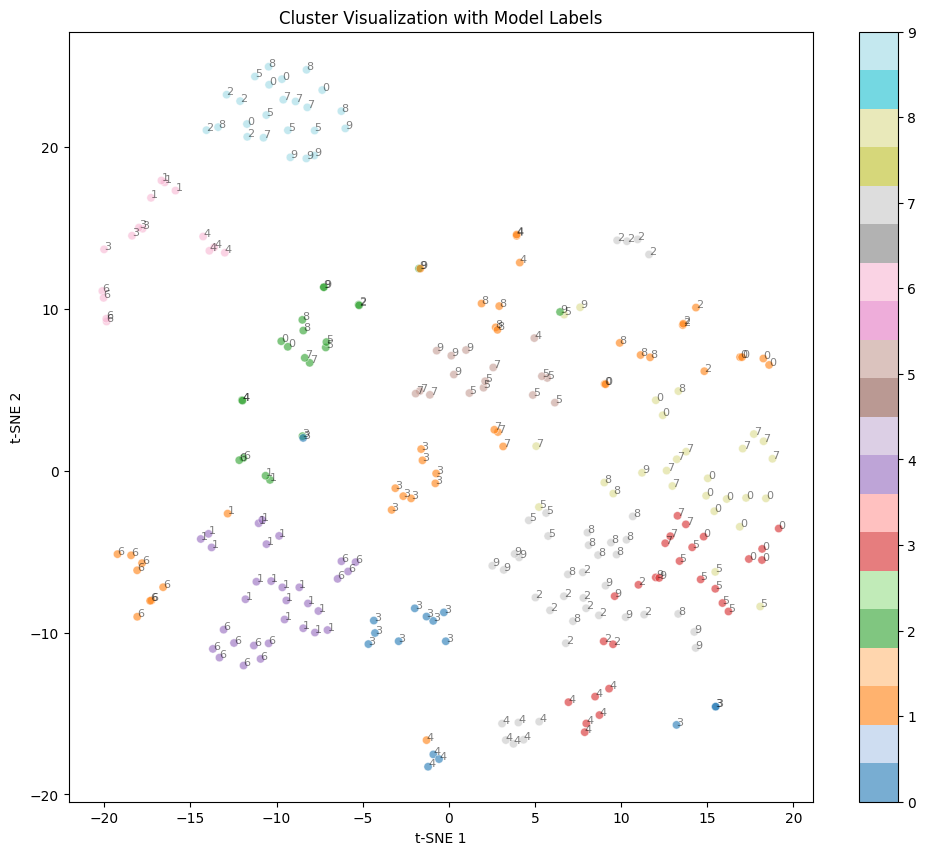

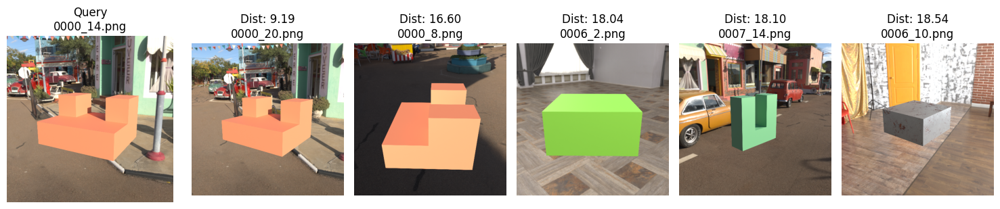

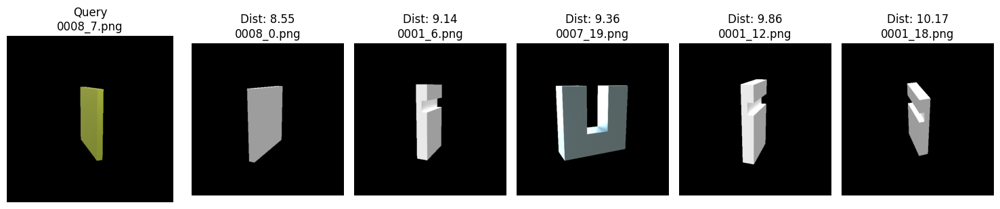

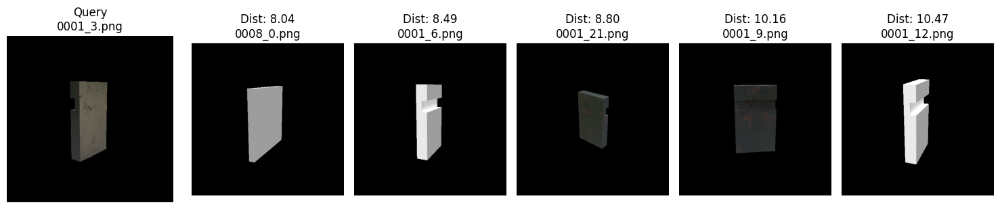

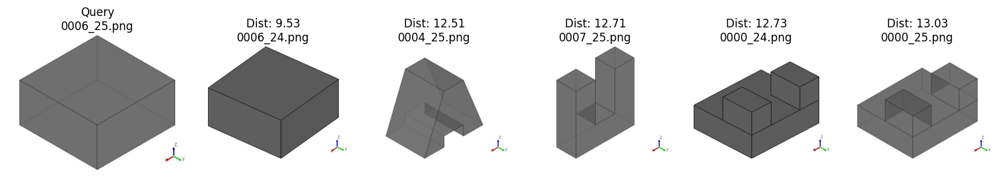

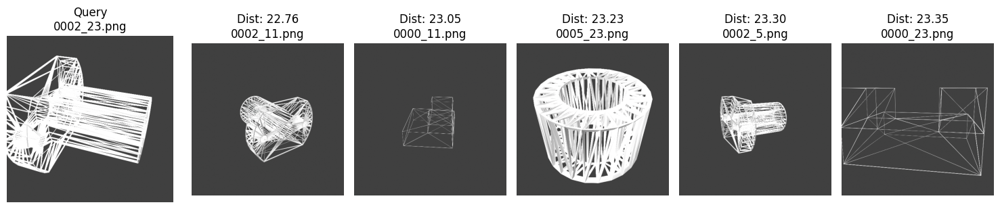

Results saved to disk


In [20]:
# Получаем список папок с моделями
model_folders = [os.path.join(DATA_PATH, f) for f in os.listdir(DATA_PATH) 
                if os.path.isdir(os.path.join(DATA_PATH, f))]
model_folders.sort()
    
print(f"Found {len(model_folders)} model folders")
    
# Извлекаем эмбеддинги
embeddings, model_labels = extract_embeddings(model_folders)
print(f"Extracted embeddings shape: {embeddings.shape}")
    
# Нормализуем эмбеддинги
normalized_embeddings = normalize_embeddings(embeddings)
print("Embeddings normalized")
    
# Кластеризация (количество кластеров = количеству моделей)
n_clusters = len(model_folders)
clusters, centers = cluster_embeddings(normalized_embeddings, n_clusters)
    
# Гарантируем разделение кластеров
separated_clusters, separated_centers = ensure_cluster_separation(
    normalized_embeddings, clusters, centers)
    
# Визуализация с помощью t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
embeddings_2d = tsne.fit_transform(normalized_embeddings)
    
visualize_clusters(embeddings_2d, separated_clusters, model_labels)
visualize_neighbors(normalized_embeddings, model_folders, n_samples=5, k_neighbors=5)
    
    
# Сохраняем результаты
np.save('model_embeddings.npy', normalized_embeddings)
np.save('model_labels.npy', model_labels)
np.save('cluster_labels.npy', separated_clusters)
print("Results saved to disk")

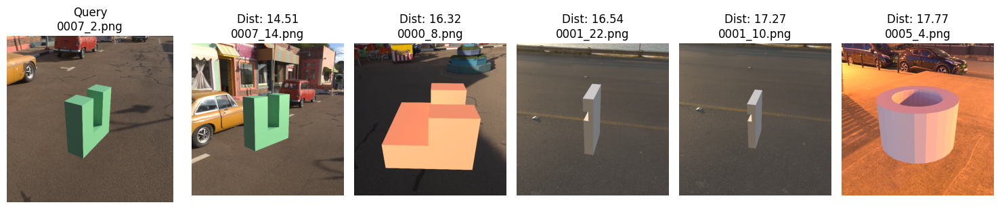

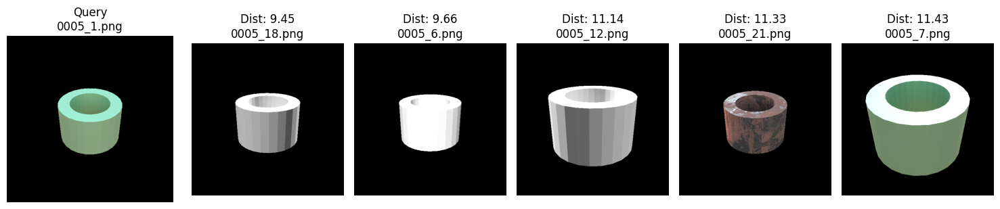

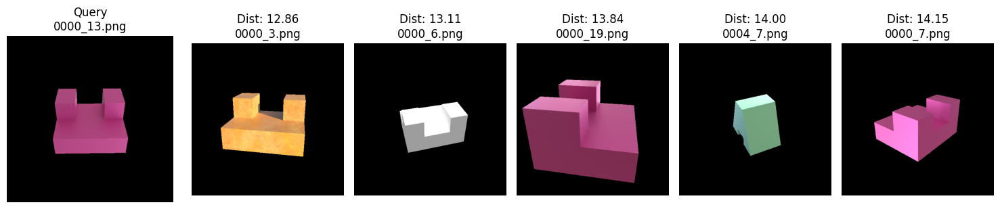

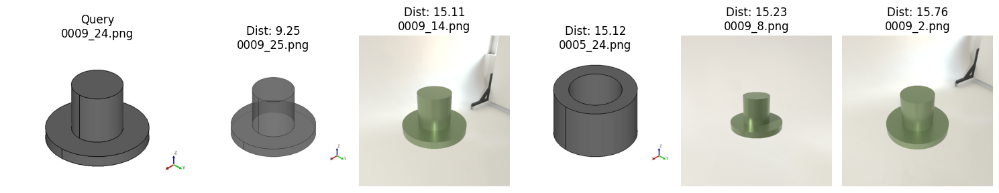

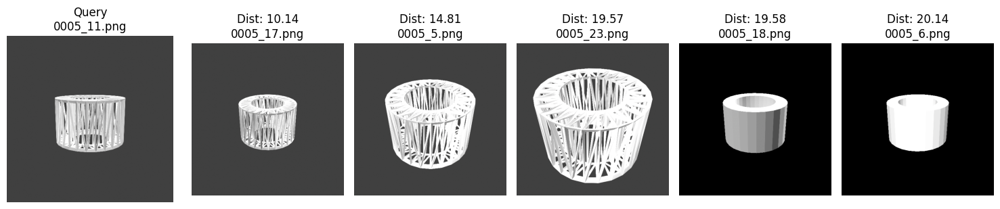

...

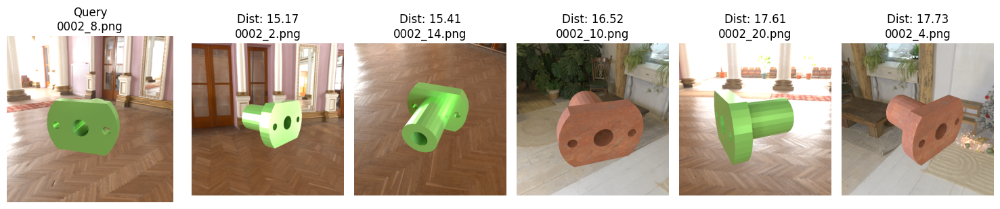

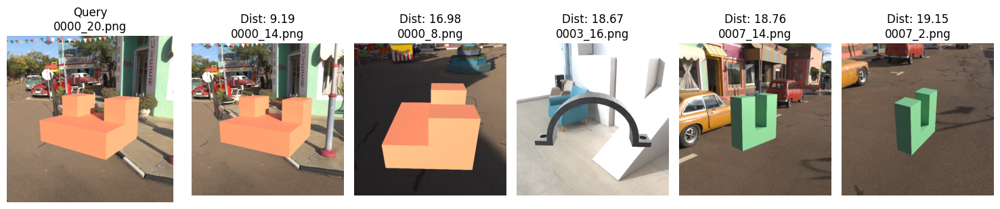

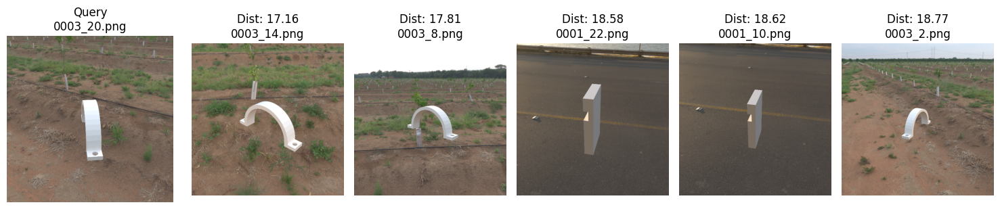

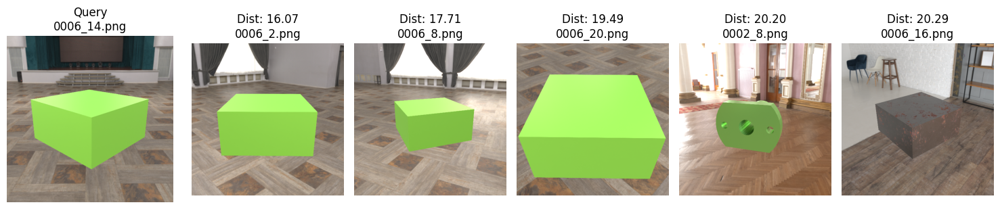

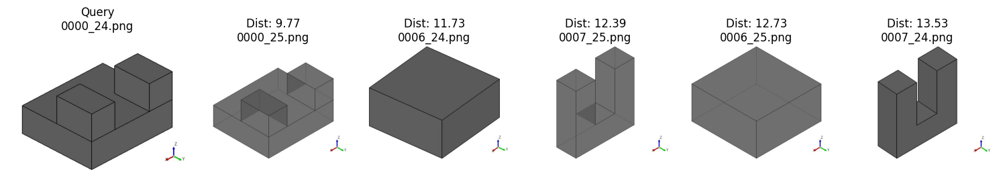

In [21]:
visualize_neighbors(normalized_embeddings, model_folders, n_samples=15, k_neighbors=5)

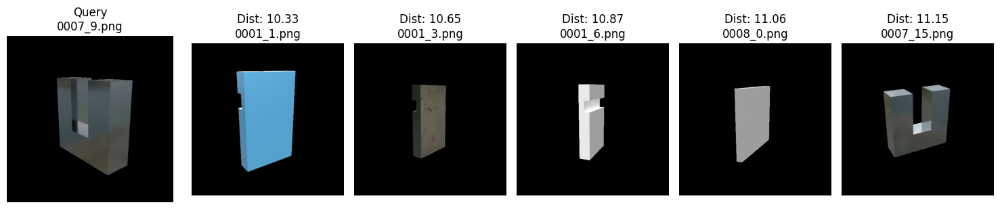

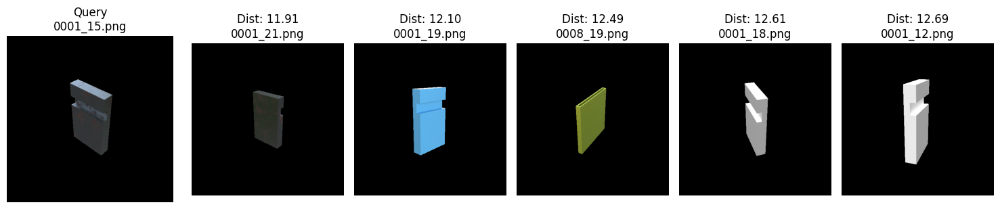

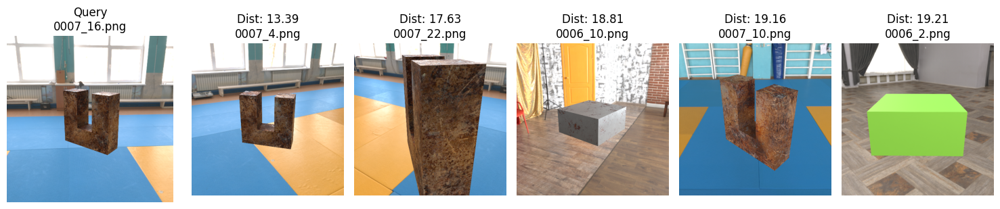

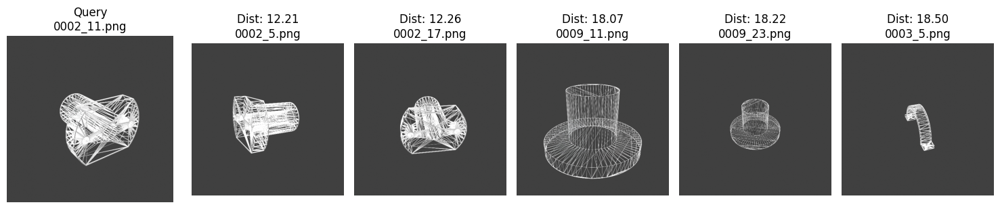

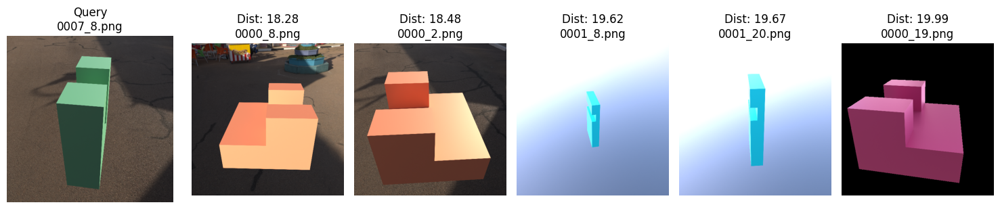

...

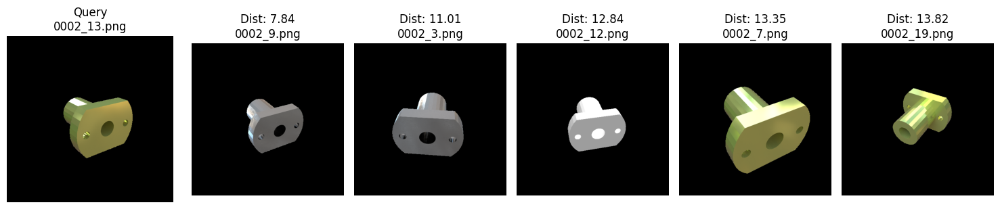

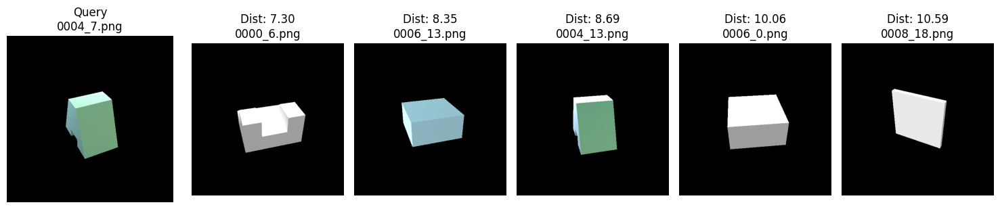

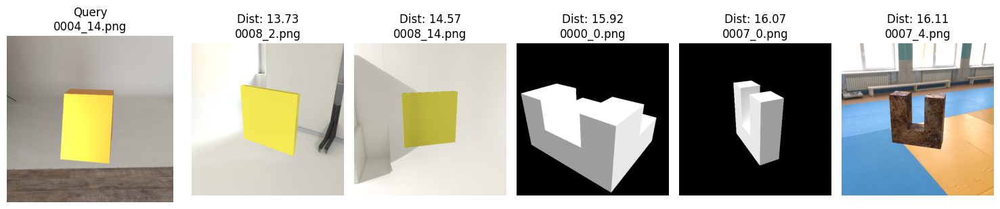

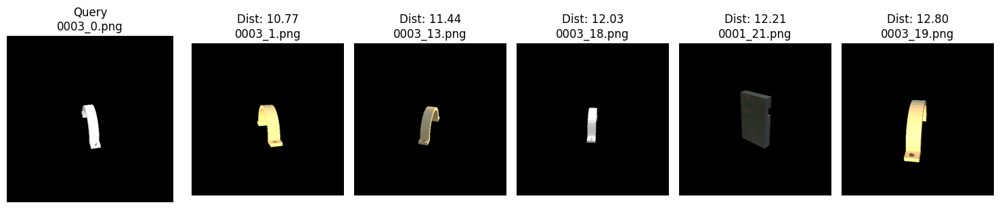

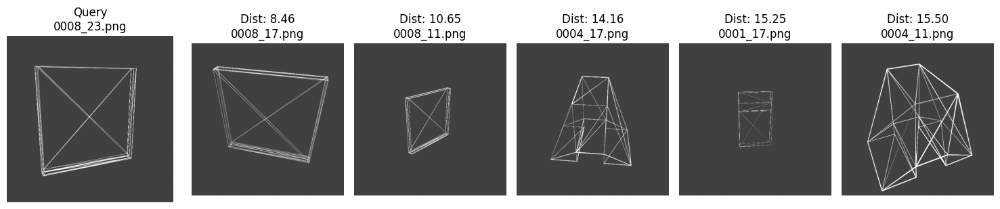

In [22]:
visualize_neighbors(normalized_embeddings, model_folders, n_samples=15, k_neighbors=5)

In [173]:
import os
import numpy as np
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import euclidean_distances
import matplotlib.pyplot as plt
import trimesh
import pyvista as pv
import cv2

In [174]:
def stl_to_images(stl_path, num_views=8, image_size=224, background=None):
    """Конвертирует STL-файл в 2D изображения с настраиваемым фоном
    
    Args:
        stl_path: путь к STL-файлу
        num_views: количество ракурсов (по умолчанию 8)
        image_size: размер выходного изображения (по умолчанию 224)
        background: 
            None - прозрачный фон (RGBA)
            str - название цвета ('orange') или HEX ('#FFA500')
            list/tuple - RGB цвет ([255,165,0])
    """
    try:
        # Загружаем модель
        mesh = trimesh.load(stl_path)
        if not isinstance(mesh, trimesh.Trimesh):
            mesh = mesh.dump().sum()
        
        # Центрируем и масштабируем модель
        mesh.apply_translation(-mesh.centroid)
        max_dim = max(mesh.extents)
        mesh.apply_scale(1.5/max_dim)

        # Создаем сцену
        plotter = pv.Plotter(off_screen=True,
                          window_size=[image_size, image_size],
                          lighting='three lights')
        
        # Добавляем модель с белым цветом
        plotter.add_mesh(pv.wrap(mesh), color='white', smooth_shading=False)
        
        # Устанавливаем черный фон для последующей замены
        plotter.set_background(color='black')
        
        # Генерируем 8 диагональных ракурсов
        angles = np.linspace(0, 2*np.pi, num_views, endpoint=False)
        distance = 2.5 * 2.5
        camera_positions = []
        for angle in angles:
            x = distance * np.cos(angle)
            y = distance * np.sin(angle)
            z = distance * 0.3  # Камера немного выше
            camera_positions.append([x, y, z])
        
        images = []
        
        for pos in camera_positions:
            plotter.camera.position = pos
            plotter.camera.focal_point = [0, 0, 0]
            plotter.camera.up = [0, 0, 1]
            plotter.camera.zoom(1.0)
            
            # Рендерим сцену
            plotter.render()
            img_array = plotter.screenshot(return_img=True)
            
            if img_array is not None:
                # Конвертируем в PIL Image
                img = Image.fromarray(img_array).convert('RGB')
                img_np = np.array(img)
                
                # Создаем маску объекта (все что не черное)
                object_mask = ~np.all(img_np == [0, 0, 0], axis=-1)
                
                if background is None:
                    # Прозрачный фон (RGBA)
                    alpha = np.where(object_mask, 255, 0).astype(np.uint8)
                    rgba = np.dstack((img_np, alpha))
                    result = Image.fromarray(rgba, 'RGBA')
                    
                    # Добавляем контур
                    alpha_arr = np.array(rgba[..., 3])
                    kernel = np.ones((3,3), np.uint8)
                    dilated = cv2.dilate(alpha_arr, kernel, iterations=1)
                    contour = dilated - alpha_arr
                    
                    # Создаем окончательное изображение с контуром
                    result_np = np.array(result)
                    result_np[contour > 0] = [0, 0, 0, 255]  # Черный контур
                    result = Image.fromarray(result_np, 'RGBA')
                    
                else:
                    # Цветной фон
                    if isinstance(background, str):
                        if background.lower() == 'orange':
                            bg_color = [255, 165, 0]
                        elif background.startswith('#'):
                            bg_color = [int(background[i:i+2], 16) for i in (1, 3, 5)]
                        else:
                            bg_color = [255, 255, 255]  # Белый по умолчанию
                    else:
                        bg_color = list(background[:3])
                    
                    # Заменяем фон
                    background_arr = np.zeros_like(img_np)
                    background_arr[:,:] = bg_color
                    result_np = np.where(object_mask[..., None], img_np, background_arr)
                    result = Image.fromarray(result_np, 'RGB')
                
                # Применяем трансформации (убедитесь, что transform ожидает правильный формат)
                if background is None:
                    # Для RGBA сначала конвертируем в RGB, потом применяем transform
                    rgb = result.convert('RGB')
                    transformed = transform(rgb)
                else:
                    transformed = transform(result)
                
                images.append(transformed)
        
        plotter.close()
        
        # Собираем все изображения в один тензор
        return torch.stack(images)
    
    except Exception as e:
        print(f"Error processing {stl_path}: {str(e)}")
        # Возвращаем тензор с правильной размерностью
        if background is None:
            return torch.zeros((num_views, 4, image_size, image_size))
        else:
            return torch.zeros((num_views, 3, image_size, image_size))

In [185]:
def process_stl_files(stl_dir, model_folders, embedding_model, centers):
    """Обрабатывает STL-файлы и возвращает эмбеддинги + соответствие кластерам"""
    stl_files = sorted([f for f in os.listdir(stl_dir) if f.endswith('.stl')])
    stl_embeddings = []
    cluster_mapping = {}
    
    # Сначала соберем все эмбеддинги для обучения scaler
    all_embeddings = []
    
    with torch.no_grad():
        for stl_file in stl_files:
            stl_path = os.path.join(stl_dir, stl_file)
            images = stl_to_images(stl_path, background='#AAAAAA')
            
            embeddings = []
            for i in range(0, len(images), BATCH_SIZE):
                batch = images[i:i+BATCH_SIZE].to(device)
                emb = embedding_model(batch)
                embeddings.append(emb.cpu().numpy())
            
            avg_embedding = np.mean(np.concatenate(embeddings), axis=0)
            all_embeddings.append(avg_embedding)
    
    # Инициализируем и обучаем scaler на всех эмбеддингах
    scaler = StandardScaler()
    scaler.fit(np.array(all_embeddings))
    
    # Теперь обрабатываем файлы с нормализацией
    with torch.no_grad():
        for stl_file, embedding in zip(stl_files, all_embeddings):
            normalized_embedding = scaler.transform(embedding.reshape(1, -1))[0]
            
            # Находим ближайший кластер
            distances = euclidean_distances([normalized_embedding], centers)[0]
            closest_cluster = np.argmin(distances)
            
            stl_embeddings.append(normalized_embedding)
            cluster_mapping[stl_file] = {
                'cluster': closest_cluster,
                'distance': float(np.min(distances))
            }
    
    return np.array(stl_embeddings), cluster_mapping

In [197]:
def extract_stl_embeddings(stl_dir, embedding_model, scaler=None):
    """
    Извлекает эмбеддинги для STL-файлов аналогично extract_embeddings
    
    Args:
        stl_dir: путь к папке с STL-файлами
        embedding_model: модель для извлечения эмбеддингов
        scaler: обученный StandardScaler (если None, будет создан новый)
    
    Returns:
        stl_embeddings: нормализованные эмбеддинги STL-файлов (n_stl, EMBEDDING_SIZE)
        stl_names: имена STL-файлов
        scaler: обученный StandardScaler
    """
    stl_files = sorted([f for f in os.listdir(stl_dir) if f.endswith('.stl')])
    all_embeddings = []
    
    with torch.no_grad():
        for stl_file in stl_files:
            stl_path = os.path.join(stl_dir, stl_file)
            images = stl_to_images(stl_path, background='#AAAAAA')
            
            embeddings = []
            for i in range(0, len(images), BATCH_SIZE):
                batch = images[i:i+BATCH_SIZE].to(device)
                emb = embedding_model(batch)
                embeddings.append(emb.cpu().numpy())
            
            # Усредняем эмбеддинги всех ракурсов для одного STL
            avg_embedding = np.mean(np.concatenate(embeddings), axis=0)
            all_embeddings.append(avg_embedding)
    
    all_embeddings = np.array(all_embeddings)
    
    # Если scaler не предоставлен, создаем и обучаем новый
    if scaler is None:
        scaler = StandardScaler()
        normalized_embeddings = scaler.fit_transform(all_embeddings)
    else:
        normalized_embeddings = scaler.transform(all_embeddings)
    
    return normalized_embeddings, stl_files, scaler

In [ ]:
# Инициализируем модель для извлечения эмбеддингов
embedding_model = EmbeddingExtractor(EMBEDDING_SIZE).to(device)
embedding_model.eval()

In [199]:
# Правильный вызов функции
stl_embeddings, stl_names, stl_scaler = extract_stl_embeddings(
    stl_dir='stl_dir',
    embedding_model=embedding_model
)

# Пример доступа к информации
for stl_file, info in stl_cluster_info.items():
    print(f"{stl_file}: Cluster {info['cluster']} (Distance: {info['distance']:.2f})")

C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:98: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  result = Image.fromarray(result_np, 'RGB')


0000.stl: Cluster 7 (Distance: 13.10)
0001.stl: Cluster 8 (Distance: 14.89)
0002.stl: Cluster 7 (Distance: 18.25)
0003.stl: Cluster 8 (Distance: 20.05)
0004.stl: Cluster 7 (Distance: 16.99)
0005.stl: Cluster 1 (Distance: 21.33)
0006.stl: Cluster 0 (Distance: 16.99)
0007.stl: Cluster 1 (Distance: 15.47)
0008.stl: Cluster 7 (Distance: 14.85)
0009.stl: Cluster 7 (Distance: 20.27)


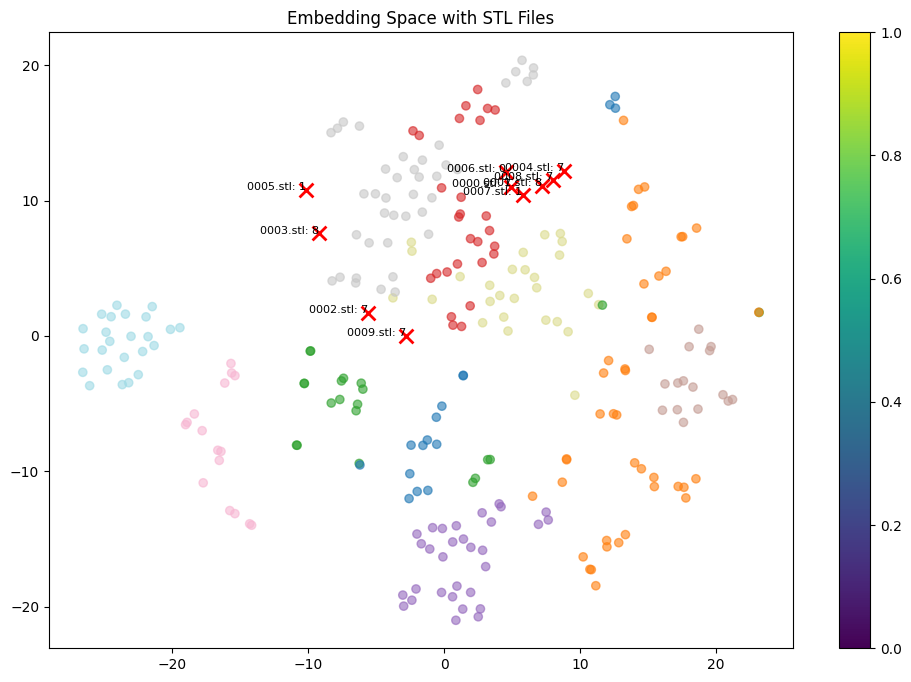

In [200]:
# Добавьте после получения результатов
tsne = TSNE(n_components=2, random_state=42)
combined_embeddings = np.vstack([normalized_embeddings, stl_embeddings])
embeddings_2d = tsne.fit_transform(combined_embeddings)

# Разделяем точки
images_2d = embeddings_2d[:-len(stl_embeddings)]
stl_2d = embeddings_2d[-len(stl_embeddings):]

plt.figure(figsize=(12, 8))
plt.scatter(images_2d[:,0], images_2d[:,1], c=separated_clusters, cmap='tab20', alpha=0.6)
plt.scatter(stl_2d[:,0], stl_2d[:,1], c='red', marker='x', s=100, linewidths=2)

# Подписи для STL-файлов
for i, (x, y) in enumerate(stl_2d):
    plt.text(x, y, f"{list(stl_cluster_info.keys())[i]}: {stl_cluster_info[list(stl_cluster_info.keys())[i]]['cluster']}", 
             fontsize=8, ha='right')

plt.colorbar()
plt.title("Embedding Space with STL Files")
plt.show()

In [160]:
np.save('stl_embeddings.npy', stl_embeddings)
with open('stl_cluster_mapping.pkl', 'wb') as f:
    pickle.dump(stl_cluster_mapping, f)

C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:69: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  result = Image.fromarray(rgba, 'RGBA')
C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:80: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  result = Image.fromarray(result_np, 'RGBA')


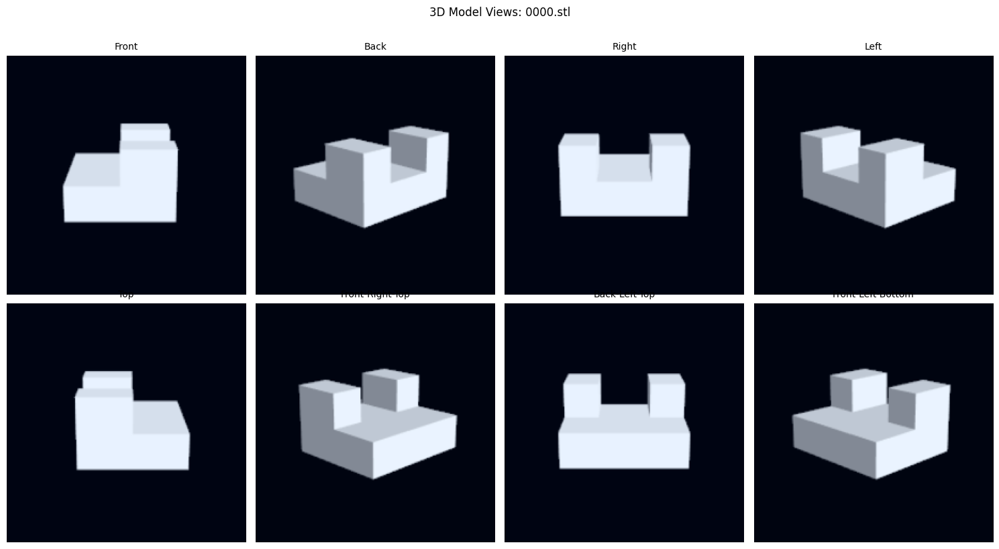

In [188]:
def visualize_stl_renders(stl_path):
    """Визуализирует все ракурсы с подписями"""
    images = stl_to_images(stl_path)
    view_names = [
        "Front", "Back", "Right", "Left",
        "Top", "Front-Right-Top", 
        "Back-Left-Top", "Front-Left-Bottom"
    ]
    
    plt.figure(figsize=(15, 8))
    for i, (img, name) in enumerate(zip(images, view_names)):
        plt.subplot(2, 4, i+1)
        img = img.permute(1, 2, 0).numpy()
        img = (img - img.min()) / (img.max() - img.min())
        plt.imshow(img)
        plt.title(name, fontsize=10)
        plt.axis('off')
    
    plt.suptitle(f"3D Model Views: {os.path.basename(stl_path)}", y=1.02)
    plt.tight_layout()
    plt.show()

# Пример использования
# Пример использования
stl_file = "stl_dir/0000.stl"
visualize_stl_renders(stl_file)

C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:69: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  result = Image.fromarray(rgba, 'RGBA')
C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:80: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  result = Image.fromarray(result_np, 'RGBA')


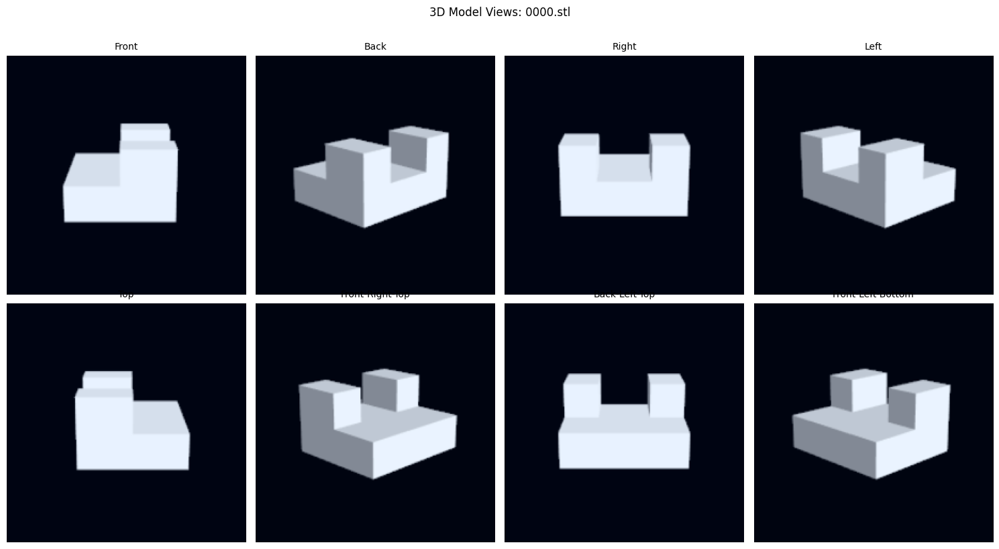

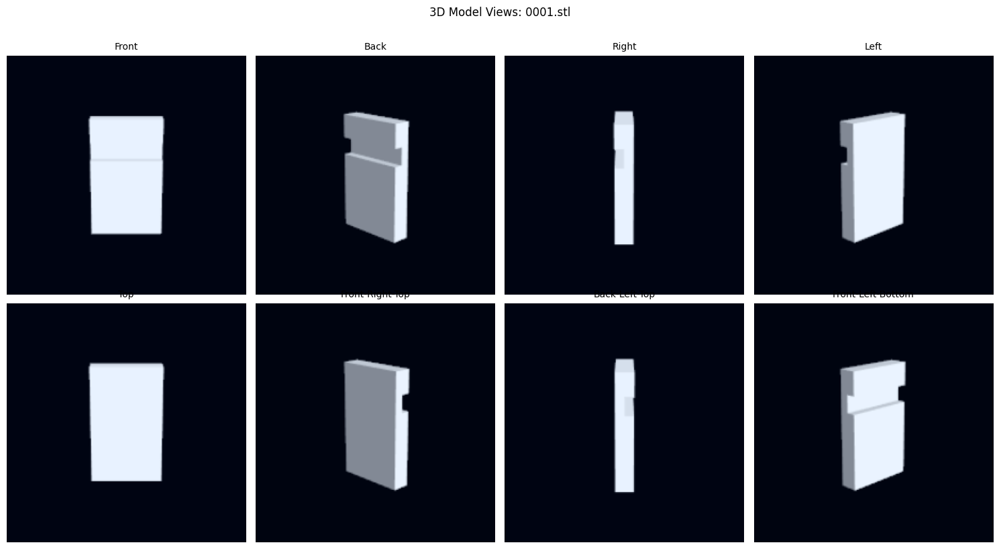

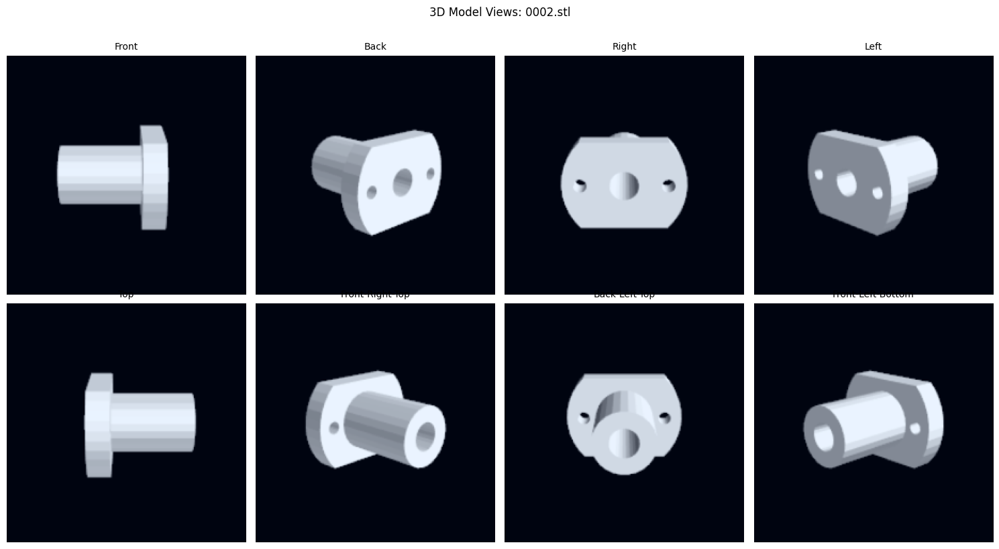

In [189]:
stl_files = [f for f in os.listdir('stl_dir') if f.endswith('.stl')]
for stl_file in stl_files[:3]:  # Покажем первые 3 для примера
    visualize_stl_renders(os.path.join('stl_dir', stl_file))

In [192]:
def find_top5_neighbors_for_stl_renders(stl_path, normalized_embeddings, model_folders, embedding_model, k=5):
    """
    Находит топ-5 ближайших изображений для каждого рендера STL-модели
    
    Args:
        stl_path: путь к STL-файлу
        normalized_embeddings: нормализованные эмбеддинги всех изображений (n_samples, EMBEDDING_SIZE)
        model_folders: список путей к папкам с обучающими изображениями
        embedding_model: модель для извлечения эмбеддингов
        k: количество ближайших соседей (по умолчанию 5)
    
    Returns:
        Список словарей с информацией о ближайших соседях для каждого рендера
    """
    # 1. Генерируем рендеры STL-модели
    stl_renders = stl_to_images(stl_path)
    
    # 2. Извлекаем эмбеддинги для каждого рендера
    render_embeddings = []
    with torch.no_grad():
        for i in range(0, len(stl_renders), BATCH_SIZE):
            batch = stl_renders[i:i+BATCH_SIZE].to(device)
            embeddings = embedding_model(batch)
            render_embeddings.append(embeddings.cpu().numpy())
    
    render_embeddings = np.concatenate(render_embeddings, axis=0)
    
    # 3. Нормализуем эмбеддинги рендеров (используем тот же scaler, что и для изображений)
    # Предполагаем, что у вас есть scaler, использованный для normalized_embeddings
    # Если нет, можно вычислить заново:
    scaler = StandardScaler()
    scaler.fit(normalized_embeddings)  # Используем оригинальные эмбеддинги для fitting
    normalized_render_embeddings = scaler.transform(render_embeddings)
    
    # 4. Вычисляем попарные расстояния между рендерами и изображениями
    distances = euclidean_distances(normalized_render_embeddings, normalized_embeddings)
    
    # 5. Находим топ-k ближайших изображений для каждого рендера
    results = []
    for render_idx in range(len(stl_renders)):
        # Получаем индексы k ближайших изображений
        nearest_indices = np.argsort(distances[render_idx])[:k]
        
        # Собираем информацию о соседях
        neighbors_info = []
        for idx in nearest_indices:
            # Находим путь к изображению по индексу
            img_path = None
            cumulative_count = 0
            for folder in model_folders:
                folder_imgs = [f for f in os.listdir(folder) if f.endswith('.png')]
                if idx < cumulative_count + len(folder_imgs):
                    img_name = sorted(folder_imgs)[idx - cumulative_count]
                    img_path = os.path.join(folder, img_name)
                    break
                cumulative_count += len(folder_imgs)
            
            neighbors_info.append({
                'image_path': img_path,
                'distance': float(distances[render_idx, idx]),
                'cluster': int(separated_clusters[idx]) if hasattr(separated_clusters, '__iter__') else None
            })
        
        results.append({
            'render_idx': render_idx,
            'nearest_neighbors': neighbors_info,
            'average_distance': float(np.mean(distances[render_idx, nearest_indices]))
        })
    
    return results

D:\ANACONDA\envs\aiijc_2025\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\ANACONDA\envs\aiijc_2025\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:69: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  result = Image.fromarray(rgba, 'RGBA')
C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:80: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-1

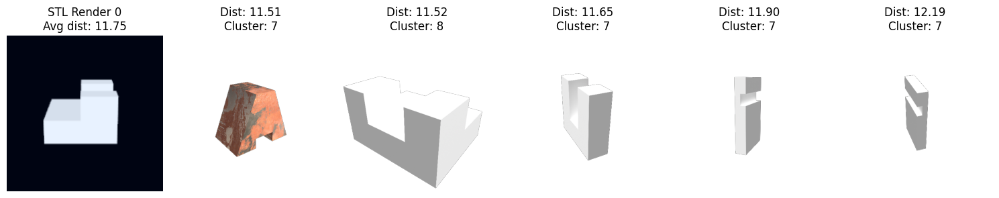

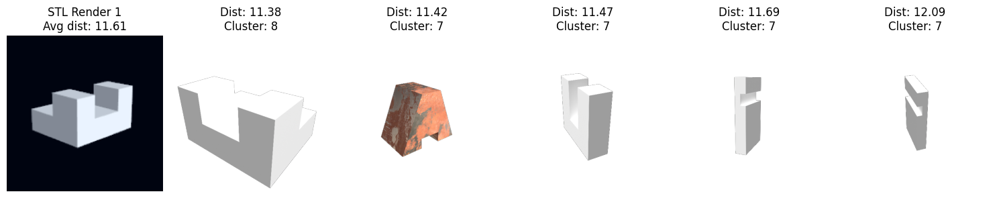

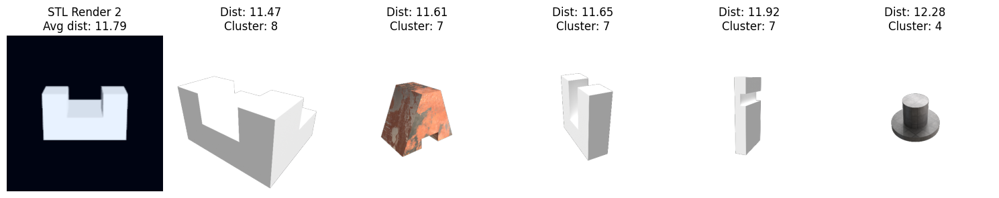

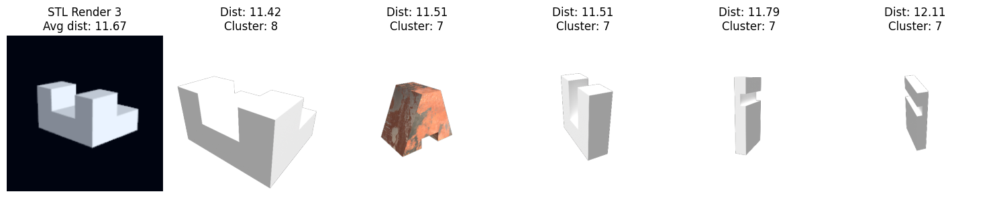

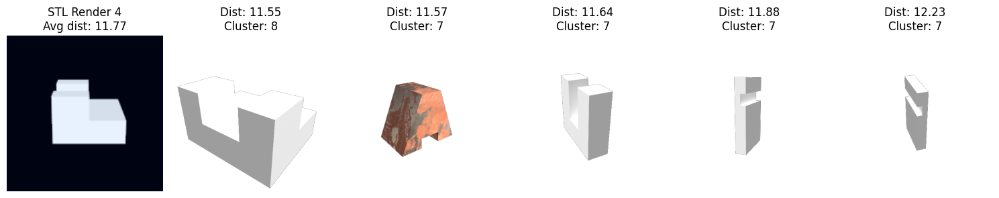

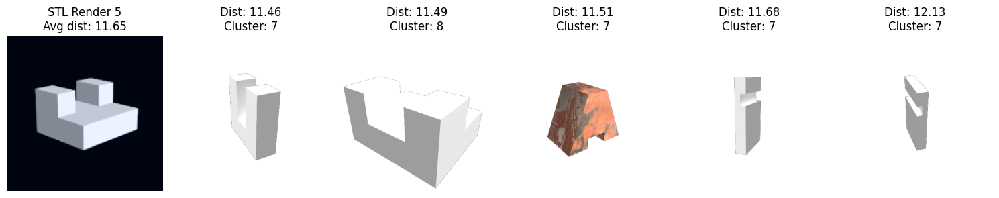

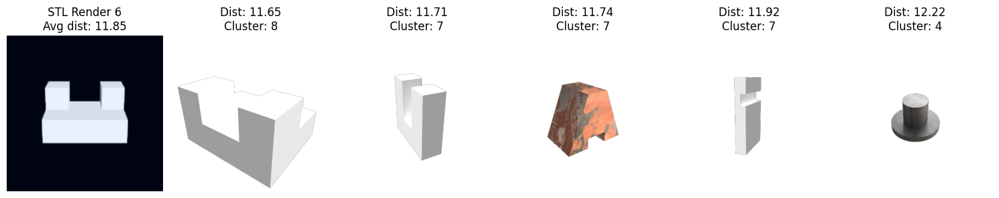

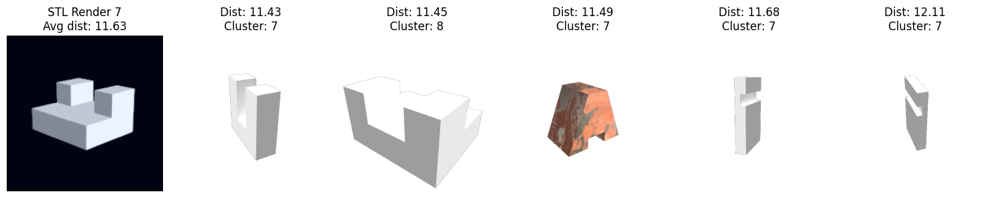

In [201]:
# Загружаем модель и данные
embedding_model = EmbeddingExtractor(EMBEDDING_SIZE).to(device)
embedding_model.eval()

# Выбираем STL-файл для анализа
stl_path = "stl_dir/0000.stl"

# Находим ближайшие изображения для каждого рендера
neighbors_info = find_top5_neighbors_for_stl_renders(
    stl_path,
    normalized_embeddings,
    model_folders,
    embedding_model,
    k=5
)

# Визуализируем результаты
def visualize_stl_neighbors(stl_path, neighbors_info):
    """Визуализирует STL рендеры и их ближайшие соседи"""
    stl_renders = stl_to_images(stl_path)
    
    for render_data in neighbors_info:
        render_idx = render_data['render_idx']
        neighbors = render_data['nearest_neighbors']
        
        plt.figure(figsize=(15, 3))
        
        # Показываем рендер
        plt.subplot(1, 6, 1)
        render_img = stl_renders[render_idx].permute(1, 2, 0).numpy()
        render_img = (render_img - render_img.min()) / (render_img.max() - render_img.min())
        plt.imshow(render_img)
        plt.title(f"STL Render {render_idx}\nAvg dist: {render_data['average_distance']:.2f}")
        plt.axis('off')
        
        # Показываем ближайшие изображения
        for i, neighbor in enumerate(neighbors, 2):
            plt.subplot(1, 6, i)
            img = Image.open(neighbor['image_path'])
            plt.imshow(img)
            plt.title(f"Dist: {neighbor['distance']:.2f}\nCluster: {neighbor['cluster']}")
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()

# Визуализация
visualize_stl_neighbors(stl_path, neighbors_info)

C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:69: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  result = Image.fromarray(rgba, 'RGBA')
C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:80: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  result = Image.fromarray(result_np, 'RGBA')


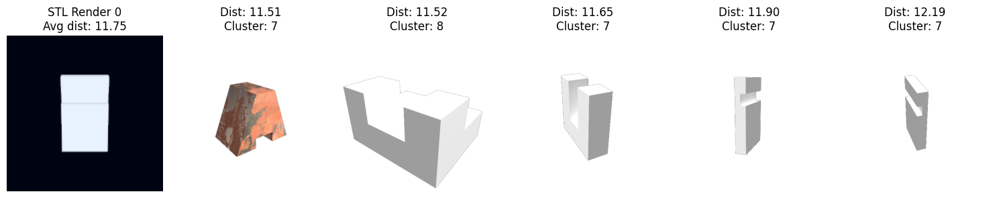

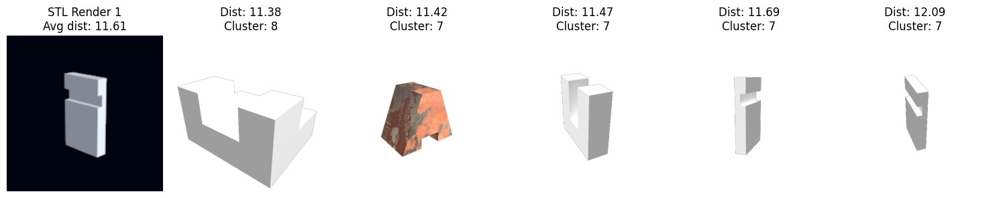

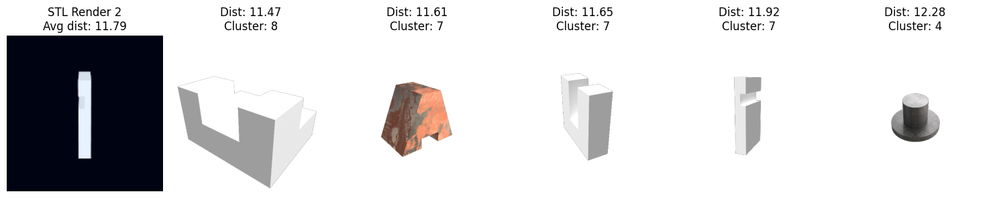

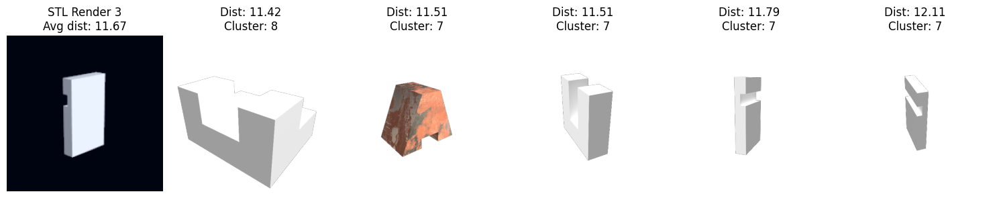

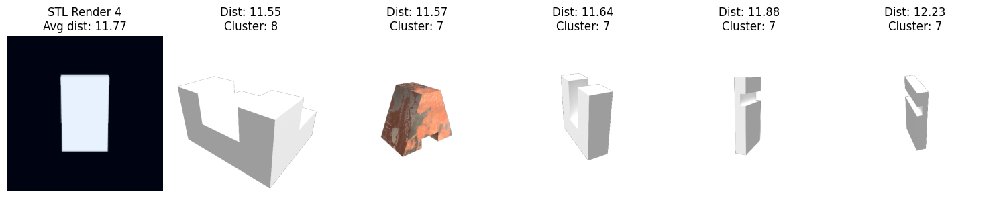

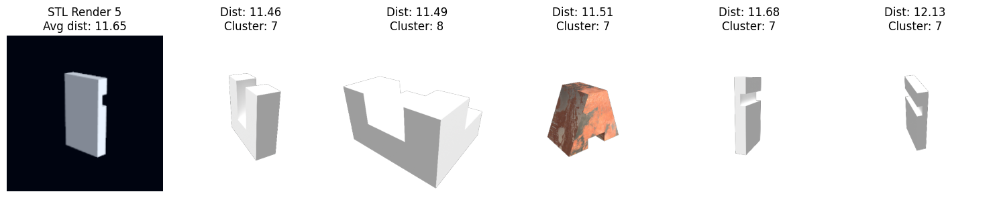

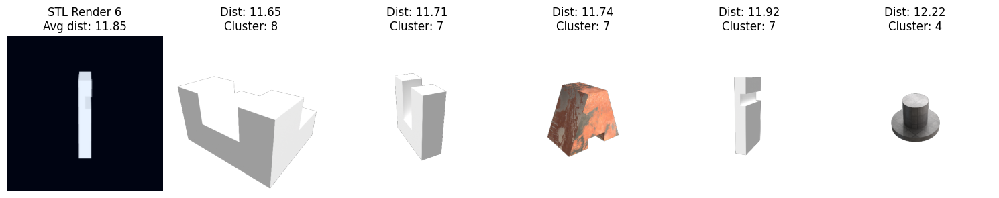

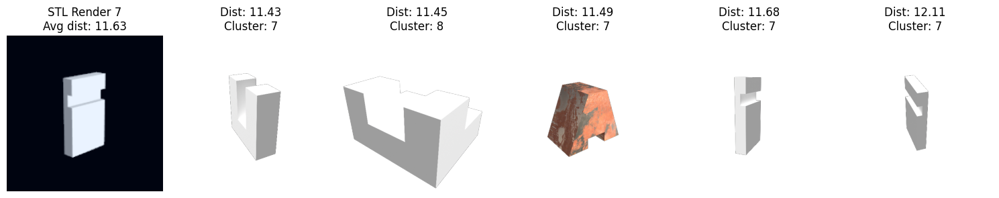

In [202]:
stl_path = "stl_dir/0001.stl"
visualize_stl_neighbors(stl_path, neighbors_info)

C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:69: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  result = Image.fromarray(rgba, 'RGBA')
C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:80: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  result = Image.fromarray(result_np, 'RGBA')


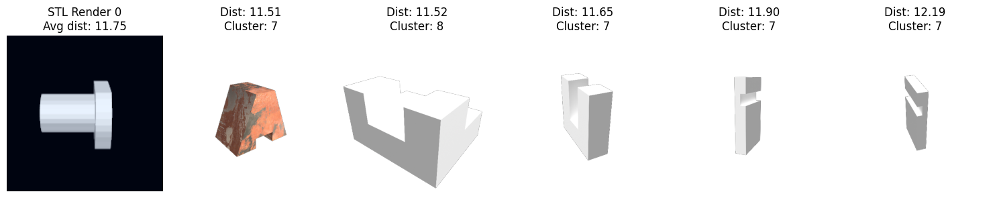

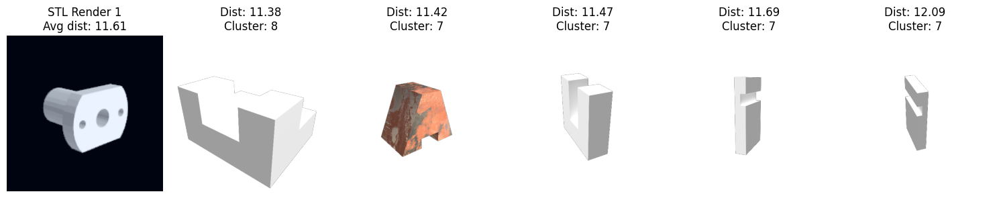

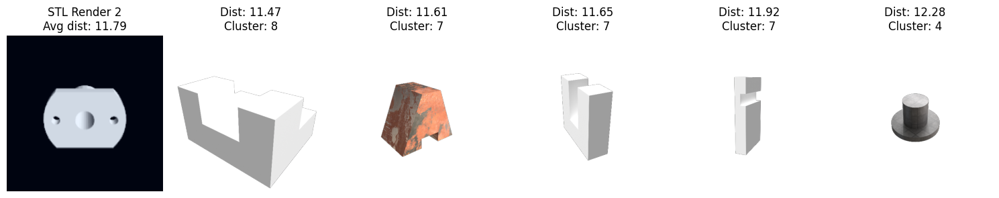

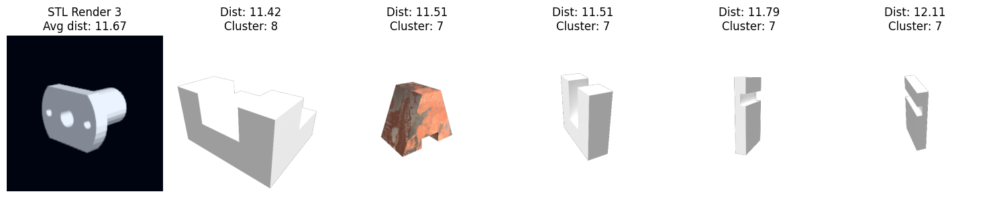

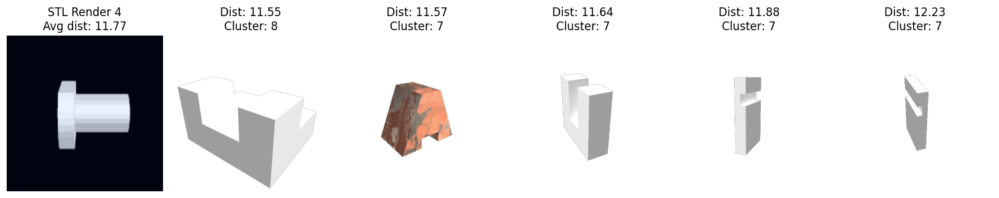

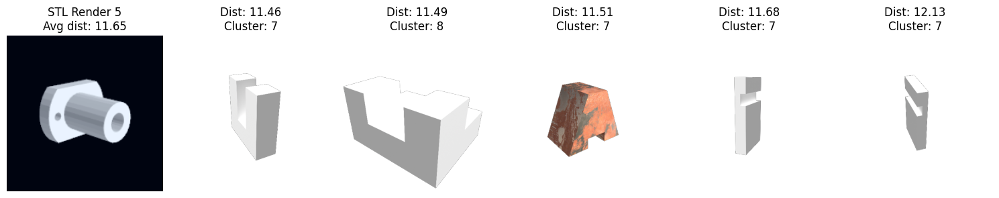

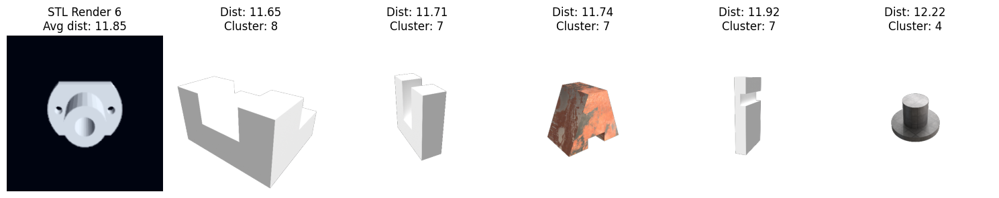

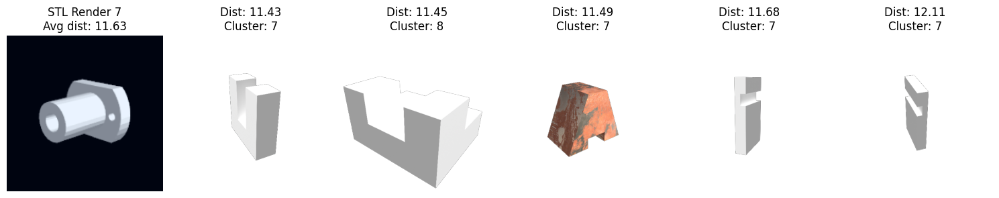

In [203]:
stl_path = "stl_dir/0002.stl"
visualize_stl_neighbors(stl_path, neighbors_info)

C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:69: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  result = Image.fromarray(rgba, 'RGBA')
C:\Users\Huawei\AppData\Local\Temp\ipykernel_7956\2800152508.py:80: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  result = Image.fromarray(result_np, 'RGBA')


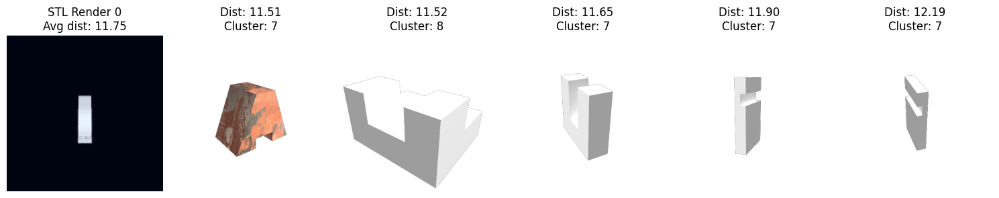

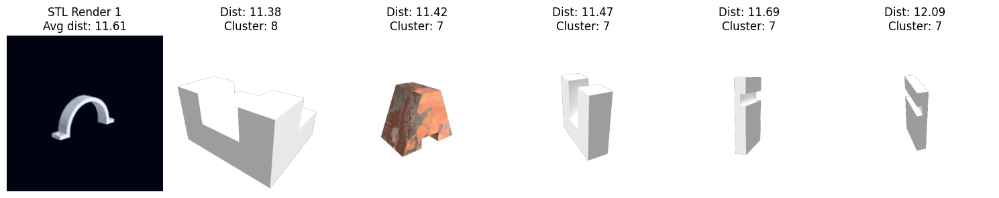

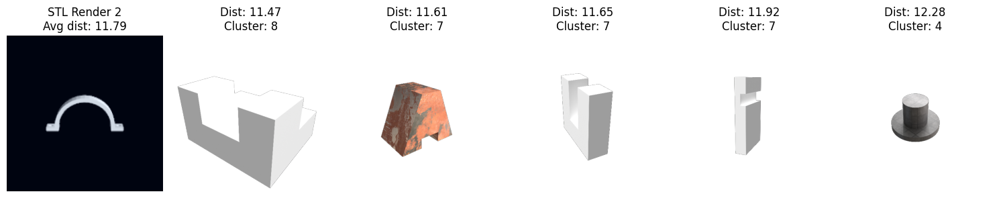

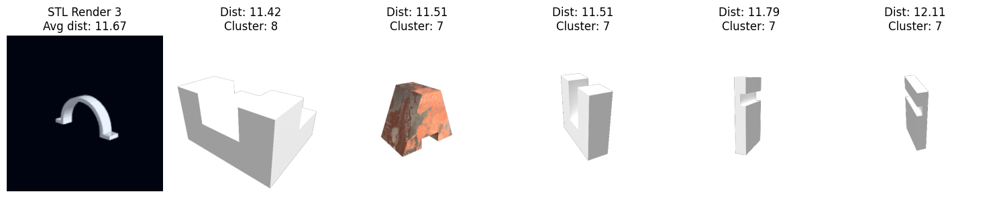

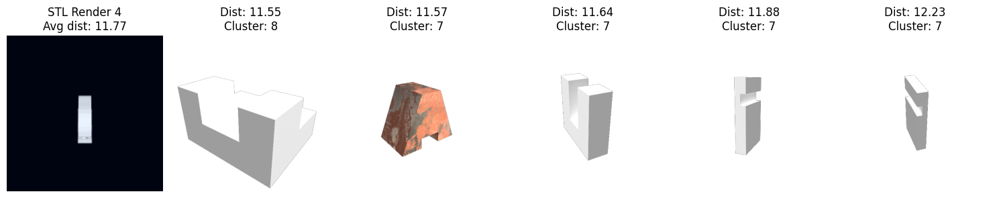

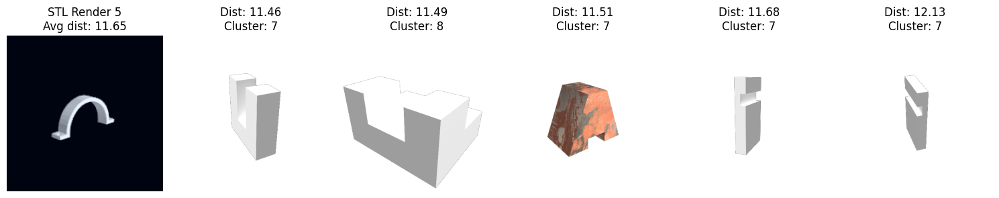

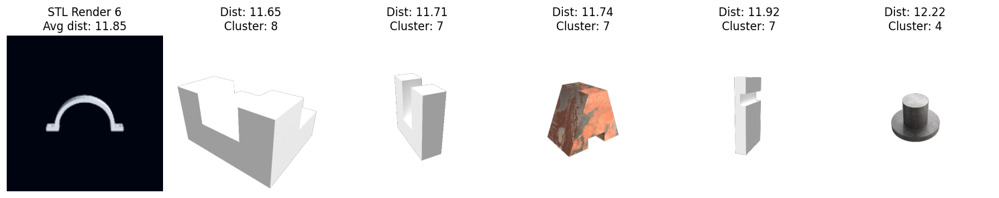

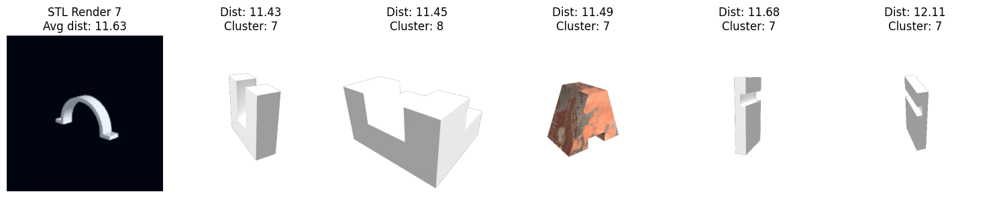

In [204]:
stl_path = "stl_dir/0003.stl"
visualize_stl_neighbors(stl_path, neighbors_info)